In [ ]:
import time
from google.colab import drive
import os
import sys
import json
import numpy as np
import requests
from tensorflow.keras.applications.xception import preprocess_input
import tensorflow as tf
import keras
import matplotlib.pyplot as plt
from datetime import datetime
from PIL import Image, ImageDraw
from sklearn import metrics
import pandas as pd
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import fbeta_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from matplotlib.pyplot import figure
general_treshold_original = 0.92
general_treshold_trained = 0.6

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


# 1.&nbsp;Datasets downloading

To download files from Kaggle you need the json file on your Google Drive (check Kaggle for the detailed explanation)

In [ ]:
!!cp /content/drive/MyDrive/Thesis/model/kaggle.json ./kaggle.json
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list

ref                                                            title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
-------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
akshaydattatraykhare/diabetes-dataset                          Diabetes Dataset                                      9KB  2022-10-06 08:55:25          16568        482  1.0              
akshaydattatraykhare/data-for-admission-in-the-university      Data for Admission in the University                  4KB  2022-10-27 11:05:45           4286        103  1.0              
thedevastator/jobs-dataset-from-glassdoor                      Salary Prediction                                     3MB  2022-11-16 13:52:31            817         29  1.0              
swaptr/layoffs-2022                                            La

In [ ]:
!kaggle datasets download -d aswin1871/cyclonewildfireflood-and-earthquake
!unzip cyclonewildfireflood-and-earthquake.zip

cyclonewildfireflood-and-earthquake.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  cyclonewildfireflood-and-earthquake.zip
replace Cyclone_Wildfire_Flood_Earthquake_Database/Cyclone/0.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!kaggle datasets download -d saurabhshahane/roadway-flooding-image-dataset
!unzip roadway-flooding-image-dataset.zip #441

Traceback (most recent call last):
  File "<frozen importlib._bootstrap>", line 677, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 728, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/usr/local/lib/python3.7/dist-packages/kaggle/__init__.py", line 19, in <module>
    from kaggle.api.kaggle_api_extended import KaggleApi
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/__init__.py", line 22, in <module>
    from kaggle.api.kaggle_api_extended import KaggleApi
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 46, in <module>
    from ..api_client import ApiClient
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api_client.py", line 33, in <module>
    from multiprocessing.pool import ThreadPool
  File "/usr/lib/python3.7/multiprocessing/__init__.py", line 16, in <module>
    from . import context
  File "/usr/lib/python3.7/multiprocessing/context.py", line 6

In [ ]:
!kaggle datasets download -d tunhunhminh/demodata # city problems
!unzip demodata.zip


demodata.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  demodata.zip
replace test.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
!kaggle datasets download -d nitishabharathi/scene-classification
!unzip scene-classification.zip

scene-classification.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  scene-classification.zip
replace test_WyRytb0.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


# 2.&nbsp;Model Initalization

<h4> Xception model inizialization</h4>

In [ ]:
xception = tf.keras.applications.Xception(include_top=False,
                                          weights='imagenet',
                                          input_shape=(512, 512, 3))

xception.trainable = False
model = tf.keras.Sequential()
model.add(xception)
model.add(tf.keras.layers.GlobalAveragePooling2D())
model.add(tf.keras.layers.Dense(units=2, activation='softmax'))
model.load_weights("/content/drive/My Drive/Thesis/model/may5") #may5.data-00000-of-00001 may5.index
model.summary()

83683744/83683744 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 16, 16, 2048)      20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 2)                 4098      
                                                                 
Total params: 20,865,578
Trainable params: 4,098
Non-trainable params: 20,861,480
_________________________________________________________________


# 3.&nbsp;Additional training for xception

## 3.1&nbsp;Composing the new dataset from the previous ones

The unified dataset for training containing half of cyclonewildfireflood-and-earthquake, city-problems, roadway-flooding and several pictures of seas as a distractors

In [ ]:
dataset_folder = "/content/Cyclone_Wildfire_Flood_Earthquake_Database/"
dataset = pd.DataFrame(columns = ['id' ,'flood'])
test_dataset = pd.DataFrame(columns = ['id' ,'flood'])
for class_dir in ['Cyclone/','Earthquake/','Flood/','Wildfire/']:
  i = 0
  image_filenames = next(os.walk(dataset_folder+class_dir))[2]
  for image_name in image_filenames:
    i += 1 
    if i >= len(image_filenames)/2: # only a half of images from each folder
      if class_dir == "Flood/":
        dataset = dataset.append({"id":dataset_folder+class_dir+image_name, "flood":1}, ignore_index=True)
      else:
        dataset = dataset.append({"id":dataset_folder+class_dir+image_name, "flood":0}, ignore_index=True)
    else: # only a half of images from each folder
      if class_dir == "Flood/":
        test_dataset = test_dataset.append({"id":dataset_folder+class_dir+image_name, "flood":1}, ignore_index=True)
      else:
        test_dataset = test_dataset.append({"id":dataset_folder+class_dir+image_name, "flood":0}, ignore_index=True)
  print("For "+class_dir+" "+ str(i)+" images taken")

print(dataset.shape)
print(test_dataset.shape)

For Cyclone/ 928 images taken
For Earthquake/ 1350 images taken
For Flood/ 1073 images taken
For Wildfire/ 1077 images taken
(2217, 2)
(2211, 2)


In [ ]:
dataset1 = pd.read_csv("/content/train.csv")
# dataset1['label'] = dataset1['label'].apply(lambda x: 1 if x==3 else 0)
dataset1["image_id"] = dataset1["image_id"].apply(lambda x: "/content/train/train/"+x)
dataset1_flood = dataset1[dataset1['label']==3]
print(dataset1_flood.shape) #1610 for flood => 13613 not flood

result_dataset = pd.DataFrame(columns=["image_id","label"])
test_result_dataset = pd.DataFrame(columns=["image_id","label"])

result_dataset = result_dataset.append(dataset1[dataset1['label']==3].iloc[:dataset1_flood.shape[0]//2])
print("Result dataset 1 ",result_dataset.shape)
test_result_dataset = test_result_dataset.append(dataset1[dataset1['label']==3].iloc[dataset1_flood.shape[0]//2:])
print("Test result dataset 1 ",test_result_dataset.shape)
for i in [0,1,2,4,5,6,7]:
  result_dataset = result_dataset.append(dataset1[dataset1['label']==i].iloc[:100])
  print("Result dataset "+str(i)+" ",result_dataset.shape)
  test_result_dataset = test_result_dataset.append(dataset1[dataset1['label']==i].iloc[100:])
  print("Test result dataset 2 "+str(i)+" ",test_result_dataset.shape)

print(result_dataset.head())
result_dataset['label'] = result_dataset["label"].apply(lambda x: 1 if x == 3 else 0)
result_dataset = result_dataset.rename(columns={"image_id":"id", "label":"flood"})
test_result_dataset['label'] = test_result_dataset["label"].apply(lambda x: 1 if x == 3 else 0)
test_result_dataset = test_result_dataset.rename(columns={"image_id":"id", "label":"flood"})

dataset = dataset.append(result_dataset)
test_dataset = test_dataset.append(test_result_dataset)
print("Result dataset ",result_dataset.shape)
print("Test result dataset ",test_result_dataset.shape)
print("Dataset ",dataset.shape)
print("Test dataset ",test_dataset.shape)


A half of the images from roadway flooding

In [ ]:
dataset_folder = "/content/Dataset/images/"

i = 0
image_filenames = next(os.walk(dataset_folder))[2]
print(dataset.shape)
for image_name in image_filenames:
  i+=1
  if i >= len(image_filenames)/2: # only a half of images from each folder
    dataset = dataset.append({"id":dataset_folder+image_name, "flood":1}, ignore_index=True)
  else:
    test_dataset = test_dataset.append({"id":dataset_folder+image_name, "flood":1}, ignore_index=True)
  print(dataset_folder+image_name)
print(dataset.shape)
print(test_dataset.shape)

Sea and street images from scene classification dataset

In [ ]:
dataset1 = pd.read_csv("/content/train-scene classification/train.csv")
folder_path = "/content/train-scene classification/train/"
dataset1 = dataset1.rename(columns={"image_name":'id',"label":"flood"})
dataset1['id'] = dataset1['id'].apply(lambda x:folder_path+x)
test_dataset1_ = pd.DataFrame(columns=['id',"flood"])
dataset1_ = pd.DataFrame(columns=['id',"flood"])
for i in [5,4]:
  dataset1_ = dataset1[dataset1["flood"]==i].iloc[:200]
  test_dataset1_ = test_dataset1_.append(dataset1[dataset1["flood"]==i].iloc[200:])
dataset1_["flood"] = 0
test_dataset1_["flood"] = 0
dataset = dataset.append(dataset1_)
test_dataset = test_dataset.append(test_dataset1_)

In [ ]:
test_dataset.to_csv("/content/drive/My Drive/Thesis/model/test-additional-dataset.csv")
dataset.to_csv("/content/drive/My Drive/Thesis/model/additional-dataset.csv")
dataset1.head()
# dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/additional-dataset.csv")
# dataset = dataset.sample(
#     frac = 1,
#     random_state = 1,
# ).reset_index()

## 3.2&nbsp;Additional training for Xception

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

data = pd.read_csv("/content/drive/My Drive/Thesis/model/additional-dataset.csv")
data = data.rename(columns={"id":"filename"})
data['flood'] = data['flood'].apply(lambda x: str(x))
data = data.sample(
    frac = 1,
    random_state = 1,
)
train_data = data.iloc[:int(len(data)*0.8)]
valid_data = data.iloc[int(len(data)*0.8):]
print(data.describe)

train_gen = ImageDataGenerator(
        rescale=1 / 255.0,
        rotation_range=20,
        zoom_range=0.05,
        width_shift_range=0.05,
        height_shift_range=0.05,
        shear_range=0.05,
        horizontal_flip=True,
        fill_mode="nearest",
        validation_split=0.20)

batch_size = 8
train_generator = train_gen.flow_from_dataframe(
    dataframe=train_data,
    directory="",
    x_col="filename",
    y_col="flood",
    target_size=(512, 512),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
valid_generator = train_gen.flow_from_dataframe(
    dataframe=valid_data,
    directory="",
    x_col="filename",
    y_col="flood",
    target_size=(512, 512),
    batch_size=batch_size,
    class_mode="categorical",
    subset='training',
    shuffle=True,
    seed=42
)
model.compile(loss="binary_crossentropy",optimizer="adam",metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
history = model.fit_generator(train_generator,
                    validation_data = valid_generator,
                    steps_per_epoch = train_generator.n//train_generator.batch_size,
                    validation_steps = valid_generator.n//valid_generator.batch_size,
                    callbacks=[keras.callbacks.ModelCheckpoint("/content/drive/My Drive/Thesis/new_train_callbacks/epoch-{epoch}.h5"),callback],
                    epochs=100)


<bound method NDFrame.describe of       Unnamed: 0                                           filename flood
3697        3697                     /content/train/train/13135.jpg     0
2948        2948                      /content/train/train/7109.jpg     1
3255        3255                      /content/train/train/4888.jpg     0
718          718  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...     0
2963        2963                      /content/train/train/7124.jpg     1
...          ...                                                ...   ...
2895        2895                      /content/train/train/7056.jpg     1
2763        2763                      /content/train/train/6924.jpg     1
905          905  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...     0
3980         207  /content/train-scene classification/train/290.jpg     0
235          235  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...     0

[4143 rows x 3 columns]>
Found 2652 validated image filenames belonging to 2 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/100
331/331 [==============================] - 264s 693ms/step - loss: 2.3855 - accuracy: 0.4705 - val_loss: 2.1819 - val_accuracy: 0.4593
Epoch 2/100
331/331 [==============================] - 219s 662ms/step - loss: 2.0823 - accuracy: 0.4535 - val_loss: 2.0290 - val_accuracy: 0.4428
Epoch 3/100
331/331 [==============================] - 218s 658ms/step - loss: 1.8577 - accuracy: 0.4474 - val_loss: 1.8192 - val_accuracy: 0.4533
Epoch 4/100
331/331 [==============================] - 219s 663ms/step - loss: 1.7088 - accuracy: 0.4308 - val_loss: 1.6296 - val_accuracy: 0.4247
Epoch 5/100
331/331 [==============================] - 218s 658ms/step - loss: 1.5691 - accuracy: 0.4217 - val_loss: 1.5190 - val_accuracy: 0.4111
Epoch 6/100
331/331 [==============================] - 221s 669ms/step - loss: 1.4243 - accuracy: 0.4051 - val_loss: 1.3734 - val_accuracy: 0.4081
Epoch 7/100
331/331 [==============================] - 224s 676ms/step - loss: 1.3328 - accuracy: 0.4085 - val_loss: 1

In [ ]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# 4.&nbsp;The evaluation functions for all datasets

## 4.1&nbsp;The functions showing extended confusion matrix

In [ ]:
def wrong_predicted_by_classesCEWF(csvfilname, path_to_files, threshold):
  df = pd.read_csv(csvfilname)
  print(df.head())
  def class_writer(x):
    if x[0] == "F":
      return "Flood"
    elif x[0] == "E":
      return "Earthquake"
    elif x[0] == "W":
      return "Wildfire"
    else :
      return "Cyclone"
  df["class_disaster"] = df["id"].apply(class_writer)
  
  tp = df[((df["prob_flood"]>threshold) & (df["class_binary"] == 1))]# true positive
  fn = df[((df["prob_flood"]<threshold) & (df["class_binary"] == 1))]# false negative
  fp = df[((df["prob_flood"]>threshold) & (df["class_binary"] == 0))]# false positive
  tn = df[((df["prob_flood"]<threshold) & (df["class_binary"] == 0))]# true negative
  cycle_amount = 928
  earth_amount = 1350
  flood_amount = 1073
  fire_amount = 1077
  print("cycle_amount = 928")
  print("earth_amount = 1350")
  print("flood_amount = 1073")
  print("fire_amount = 1077")
  
  for df in [(fn,"False negatives"),(fp,"False positives")]:
    print(df[1])
    for cd in ["Cyclone","Wildfire","Earthquake","Flood"]:
      print(cd+": ", len(df[0][df[0]["class_disaster"]==cd]))#

  data.head()

In [ ]:
def wrong_predicted_by_classesCP(csvfilname, path_to_files, threshold):
  df = pd.read_csv(csvfilname)
  print(df.head())

  fp = df[((df["prob_flood"]>threshold) & (df["class_binary"] == 0))]# false positive
  tn = df[((df["prob_flood"]<threshold) & (df["class_binary"] == 0))]# true negative
  tp = df[((df["prob_flood"]>threshold) & (df["class_binary"] == 1))]# true posive positive
  fn = df[((df["prob_flood"]<threshold) & (df["class_binary"] == 1))]# false negative
  no_event_amount = len(df[df["label"]==0])
  fallen_tree_amount   = len(df[df["label"]==1])
  fire_amount          = len(df[df["label"]==2])
  flooding_amount   = len(df[df["label"]==3])
  bad_road_amount    = len(df[df["label"]==4])
  traffic_jam_amount = len(df[df["label"]==5])
  garbage_amount    = len(df[df["label"]==6])
  traffic_accident_amount = len(df[df["label"]==7])

  print("no_event_amount = ",no_event_amount)
  print("   false negatives:",len(fp[fp["label"]==0]))
  print("   true negatives:", len(tn[tn["label"]==0]))
  print("fallen_tree_amount  = ",fallen_tree_amount  )
  print("   false negatives:",len(fp[fp["label"]==1]))
  print("   true negatives:", len(tn[tn["label"]==1]))
  print("fire_amount = ",fire_amount)
  print("   false negatives:",len(fp[fp["label"]==2]))
  print("   true negatives:", len(tn[tn["label"]==2]))

  print("flooding_amount   = ",flooding_amount  )
  print("   true positives:",len(tp[tp["label"]==3]))
  print("   false positives:", len(fn[fn["label"]==3]))

  print("bad_road_amount    = ",bad_road_amount   )
  print("   false negatives:",len(fp[fp["label"]==4]))
  print("   true negatives:", len(tn[tn["label"]==4]))
  print("traffic_jam_amount = ",traffic_jam_amount)
  print("   false negatives:",len(fp[fp["label"]==5]))
  print("   true negatives:", len(tn[tn["label"]==5]))
  print("garbage_amount    = ",garbage_amount   )
  print("   false negatives:",len(fp[fp["label"]==6]))
  print("   true negatives:", len(tn[tn["label"]==6]))
  print("traffic_accident_amount= ",traffic_accident_amount)
  print("   false negatives:",len(fp[fp["label"]==7]))
  print("   true negatives:", len(tn[tn["label"]==7]))
  
  data.head()

In [ ]:
def wrong_predicted_by_classesSC(csvfilname, path_to_files, threshold):
  #Buildings Forests Mountains Glacier Street Sea
  df = pd.read_csv(csvfilname)
  print(df.head())

  fp = df[((df["prob_flood"]>threshold) & (df["class_binary"] == 0))]# false positive
  tn = df[((df["prob_flood"]<threshold) & (df["class_binary"] == 0))]# true negative
  buildings_amount = len(df[df["label"]==0])
  forests_amount   = len(df[df["label"]==1])
  mountains_amount = len(df[df["label"]==2])
  glacier_amount   = len(df[df["label"]==3])
  street_amount    = len(df[df["label"]==4])
  sea_amount       = len(df[df["label"]==5])
  print("buildings_amount = ",buildings_amount)
  print("   false positives:",len(fp[fp["label"]==0]))
  print("   true negatives:", len(tn[tn["label"]==0]))
  print("forests_amount   = ",forests_amount  )
  print("   false positives:",len(fp[fp["label"]==1]))
  print("   true negatives:", len(tn[tn["label"]==1]))
  print("mountains_amount = ",mountains_amount)
  print("   false positives:",len(fp[fp["label"]==2]))
  print("   true negatives:", len(tn[tn["label"]==2]))
  print("glacier_amount   = ",glacier_amount  )
  print("   false positives:",len(fp[fp["label"]==3]))
  print("   true negatives:", len(tn[tn["label"]==3]))
  print("street_amount    = ",street_amount   )
  print("   false positives:",len(fp[fp["label"]==4]))
  print("   true negatives:", len(tn[tn["label"]==4]))
  print("sea_amount       = ",sea_amount      )
  print("   false positives:",len(fp[fp["label"]==5]))
  print("   true negatives:", len(tn[tn["label"]==5]))

## 4.2&nbsp; Unified functions for all datasets

In [ ]:
def show_pred_img(csvfilname, path_to_files, threshold):

  df = pd.read_csv(csvfilname)
  tp = (df[((df["prob_flood"]>threshold) & (df["class_binary"] == 1))], "lime") # true positive
  fn = (df[((df["prob_flood"]<threshold) & (df["class_binary"] == 1))], "yellow") # false positive
  fp = (df[((df["prob_flood"]>threshold) & (df["class_binary"] == 0))], "red") # false negative
  tn = (df[((df["prob_flood"]<threshold) & (df["class_binary"] == 0))], "blue") # true negative
  print("tp len: ",len(tp[0]))
  print("fp len: ",len(fp[0]))
  print("fn len: ",len(fn[0]))
  print("tn len: ",len(tn[0]))
  for ret in [tp,fp,fn,tn]:
    fig_rows = min(4, int(np.ceil(len(ret[0]) / 5)))
    fig, axes = plt.subplots(fig_rows, 5, figsize=(13, 2 * fig_rows))
    for f_n, ax in zip(ret[0]['id'], axes.ravel()):
        img_id = os.path.splitext(os.path.basename(path_to_files+f_n))[0] 
        ax.imshow(plt.imread(path_to_files+f_n), interpolation='bicubic')
        ax.set_xticks([])
        ax.set_yticks([])
        for pos in ['top', 'bottom', 'right', 'left']:
          ax.spines[pos].set_edgecolor(ret[1])
          ax.spines[pos].set_linewidth(2)
  fig.tight_layout()
  plt.show()

Roc curve function

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay

def roc_curve_func(y_test, y_score):
  fpr = dict()
  tpr = dict()
  roc_auc = dict()

  for i in range(2):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
  fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
  roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
  plt.figure()
  lw = 2
  plt.plot(
      fpr[1],
      tpr[1],
      color="darkorange",
      lw=lw,
      label="ROC curve (area = %0.2f)" % roc_auc[1],
  )
  plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")
  plt.title("Receiver operating characteristic example")
  plt.legend(loc="lower right")
  plt.show()

Fbeta function

In [ ]:
def fbeta_curve(csv_filename, b=0.5):
    data = pd.read_csv(csv_filename)
    fscores = []
    for i in np.arange(0.1,1.0,0.01):
      data["prob_class"] = data['prob_flood'].apply(lambda x: 1 if x > i else 0)
      fscores.append(fbeta_score(data["class_binary"], data["prob_class"], average='micro', beta=b))
    plt.plot(np.arange(0.1,1.0,0.01),fscores,label='F-scores with beta = {}'.format(b))
    plt.xlabel("Probabilty threshold")
    plt.ylabel("Fbeta score")
    plt.title("'F-scores with beta = {}'.format(b)")
    plt.legend(loc="lower right")
    plt.show()

Evaluation function unites all quantitive functions 

In [ ]:
def evaluation(csv_filename,threshold=0.5,balancing_samples=0):

  cycl_eval = pd.read_csv(csv_filename)
  cycl_eval['not_class_binary'] = cycl_eval['class_binary'].apply(lambda x: 1 if x==0  else 0)
  roc_curve_func(cycl_eval[['class_binary','not_class_binary']].to_numpy(),cycl_eval[['prob_flood','prob_not_flood']].to_numpy())
  
  prec, recall, _ = precision_recall_curve(cycl_eval['class_binary'], cycl_eval['prob_flood'])
  pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot()
  plt.show()
  cycl_eval['threshold'] = cycl_eval['prob_flood'].apply(lambda x: 1 if x>threshold else 0)
  print(metrics.classification_report(cycl_eval['class_binary'],cycl_eval['threshold']))
  
  fbeta_curve(csv_filename)
  if (balancing_samples != 0 ):
    print("Balanced roc curve")
    only_floods = cycl_eval[cycl_eval['class_binary']==1]
    only_not_floods = cycl_eval[cycl_eval['class_binary']!=1]
    shuffled = only_not_floods.sample(n = balanced)
    balanced = pd.concat([only_floods,shuffled])
    roc_curve_func(balanced[['class_binary','not_class_binary']].to_numpy(),balanced[['prob_flood','prob_not_flood']].to_numpy())

    prec, recall, _ = precision_recall_curve(balanced['class_binary'], balanced['prob_flood'])
    pr_display = PrecisionRecallDisplay(precision=prec, recall=recall).plot()
    print(metrics.classification_report(balanced['class_binary'],balanced['threshold']))
  

# 5.&nbsp; Prediction and evaluation for original Xception

## 5.1&nbsp; CWFE dataset

### 5.1.1&nbsp; Prediction

In [ ]:
dataset_folder = "/content/Cyclone_Wildfire_Flood_Earthquake_Database/"
image_size = (512,512)
results = {}
for class_dir in ['Cyclone/','Earthquake/','Flood/','Wildfire/']:
  i = 0
  image_filenames = next(os.walk(dataset_folder+class_dir))[2]
  print(len(image_filenames))
  print(dataset_folder+class_dir);
  for image_name in image_filenames:
    i+=1
    pil_image = Image.open(dataset_folder +class_dir+ image_name).convert('RGB')
    pil_image = pil_image.resize((512, 512))
    img_array = np.array(pil_image)
    img_array = np.expand_dims(img_array, 0)
    img_array = preprocess_input(img_array)
    prediction = model.predict(img_array)
    print(str(i)+'/'+str(len(image_filenames)), end="\r")
    results[class_dir+image_name] = prediction

StopIteration: ignored

In [ ]:
to_write = pd.DataFrame(columns = ['id' ,'prob_flood','prob_not_flood'])
for key,value in results.items():
  to_write = to_write.append({'id' : key, 'prob_flood':value[0][0],'prob_not_flood':value[0][1]}, ignore_index=True )
to_write.to_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-results.csv", index=False)

### 5.1.2&nbsp; No need to run this - CWFE Batch prediction(different version of prediction) 

In [ ]:
# dataset_folder = "/content/Cyclone_Wildfire_Flood_Earthquake_Database/"
# image_size = (512,512)
# results = {}
# data = pd.DataFrame(columns = ['id'])
# for class_dir in ['Cyclone/','Earthquake/','Flood/','Wildfire/']:
#   i = 0
#   image_filenames = next(os.walk(dataset_folder+class_dir))[2]
#   print(len(image_filenames))
#   print(dataset_folder+class_dir)
#   for image_filename in image_filenames:
#     data = data.append({'filename' : dataset_folder+class_dir+image_filename}, ignore_index=True)
# data.set_index('filename')
# print(data.head())
# img_generator = keras.preprocessing.image.ImageDataGenerator(
#      rescale=1./255.
# )

# predicted = model.predict_generator(img_generator.flow_from_dataframe(
#     data, class_mode=None, shuffle=False,
#      target_size=(512,512), batch_size=8
# ), verbose=True, workers=8, use_multiprocessing=True, max_queue_size=32)

# pred = np.ndarray((len(data),) + predicted.shape[1:], dtype=predicted.dtype)
# pred[np.asarray(data.index)] = predicted

# print(pred)


In [ ]:
# data["prob_flood"] = pred[:,0]
# data["prob_not_flood"] = pred[:,1]
# data["class_binary"] = data["filename"].apply(lambda x: 1 if x[0]=="F" else 0)
# data.rename(columns={"filename":"image_id"})
# data.drop(columns=["id"])
# data.to_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes1.csv")

In [ ]:
# evaluation("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes1.csv",threshold=0.)

### 5.1.3&nbsp; Evaluation

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-results.csv")
print(data.head())
data["class_binary"] = data["id"].apply(lambda x: 1 if x[0]=="F" else 0)
data.rename(columns={"id":"image_id"})
data.to_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes.csv", index=False)

                id  prob_flood  prob_not_flood
0  Cyclone/820.jpg    0.999979        0.000021
1  Cyclone/571.jpg    0.661764        0.338236
2  Cyclone/604.jpg    0.774547        0.225453
3  Cyclone/118.jpg    0.072960        0.927040
4  Cyclone/869.jpg    0.870989        0.129010


In [ ]:
# data = pd.read_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes.csv")
# data = data.drop(columns=["Unnamed: 0","Unnamed: 0.1","Unnamed: 0.1.1","Unnamed: 0.1.1.1","Unnamed: 0.1.1.1.1","Unnamed: 0.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1","Unnamed: 0.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1.1"])
# data.head()
# data.to_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes.csv")

Evaluation of Cyclone_Wildfire_Flood_Earthquake results


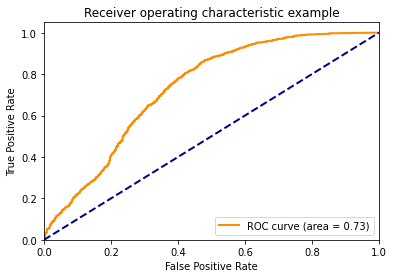

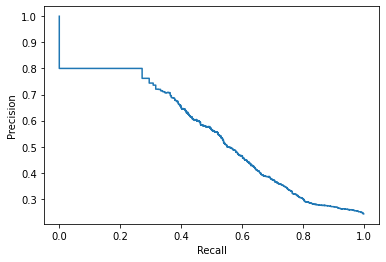

              precision    recall  f1-score   support

           0       0.87      0.58      0.70      3355
           1       0.36      0.73      0.48      1073

    accuracy                           0.62      4428
   macro avg       0.61      0.65      0.59      4428
weighted avg       0.75      0.62      0.65      4428



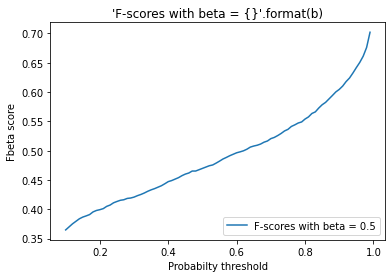

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes.csv",threshold=general_treshold_original)

tp len:  790
fp len:  1468
fn len:  283
tn len:  1887


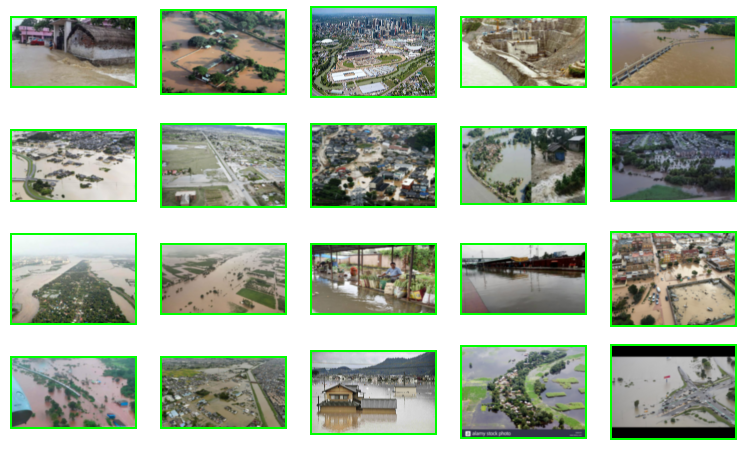

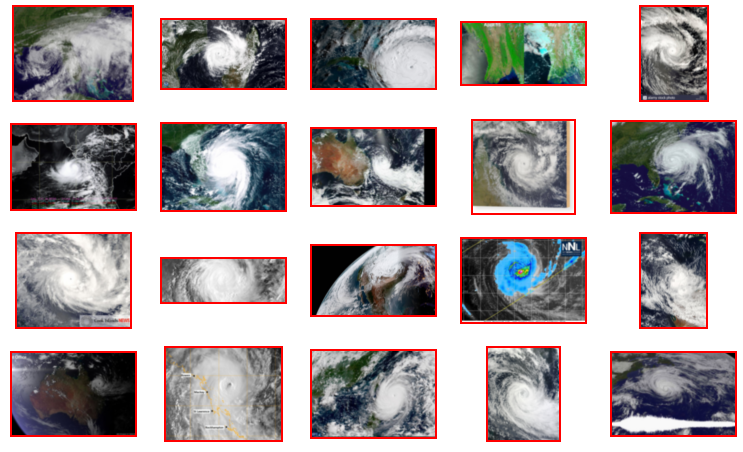

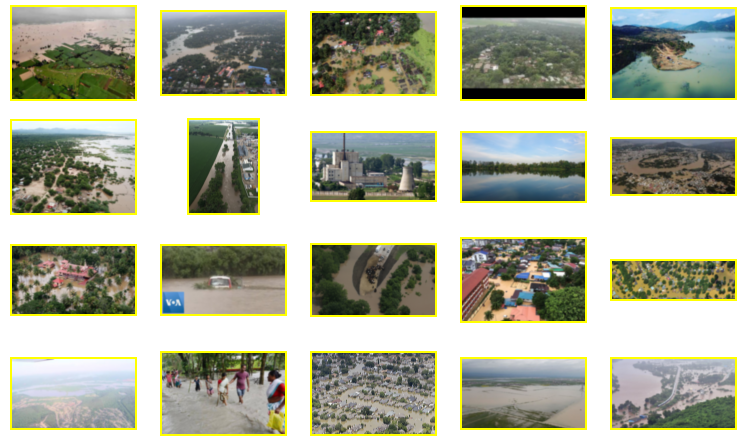

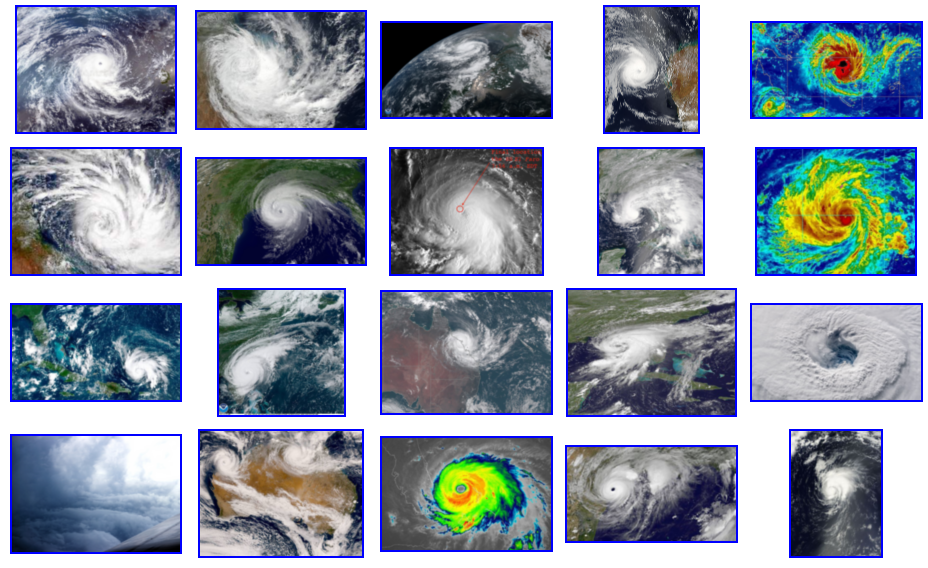

In [ ]:
show_pred_img("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes.csv","/content/Cyclone_Wildfire_Flood_Earthquake_Database/",0.9)

In [ ]:
wrong_predicted_by_classesCEWF("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes.csv","/content/Cyclone_Wildfire_Flood_Earthquake_Database/",0.92)

                id  prob_flood  prob_not_flood  class_binary
0  Cyclone/820.jpg    0.999979        0.000021             0
1  Cyclone/571.jpg    0.661764        0.338236             0
2  Cyclone/604.jpg    0.774547        0.225453             0
3  Cyclone/118.jpg    0.072960        0.927040             0
4  Cyclone/869.jpg    0.870989        0.129010             0
cycle_amount = 928
earth_amount = 1350
flood_amount = 1073
fire_amount = 1077
False negatives
Cyclone:  0
Wildfire:  0
Earthquake:  0
Flood:  295
False positives
Cyclone:  391
Wildfire:  186
Earthquake:  820
Flood:  0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


NameError: ignored

## 5.2&nbsp;Roadway Flooding dataset

### 5.2.1&nbsp; Prediction

In [ ]:
dataset_folder = "/content/Dataset/images/"
image_size = (512,512)
results = {}

i = 0
image_filenames = next(os.walk(dataset_folder))[2]
print(image_filenames)
print(dataset_folder);
for image_name in image_filenames:
  i+=1
  print(i)
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  img_array = np.array(pil_image)
  img_array = np.expand_dims(img_array, 0)
  img_array = preprocess_input(img_array)
  print(str(i)+'/'+str(len(image_filenames)), end="\r")
  prediction = model.predict(img_array)
  results[image_name] = prediction

NameError: ignored

In [ ]:
to_write = pd.DataFrame(columns = ['image_id' ,'prob_flood','prob_not_flood'])
for key,value in results.items():
  to_write = to_write.append({'image_id' : key, 'prob_flood':value[0][0],'prob_not_flood':value[0][1]}, ignore_index=True )
to_write['class_binary'] = 1 
to_write.to_csv("/content/drive/My Drive/Thesis/model/roadway-flooding-with-classes.csv", index=False)

### 5.2.2&nbsp; Evaluation

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/roadway-flooding-with-classes.csv")
# data = data.drop(columns="Unnamed: 0")
# data = data.rename(columns={"id":"image_id"})
# data.to_csv("/content/drive/My Drive/Thesis/model/roadway-flooding-with-classes.csv", index=False)


,image_id,prob_flood,prob_not_flood,class_binary
0,image_367.jpg,1.000000,2.390188e-08,1
1,image_314.jpg,1.000000,3.147184e-07,1
2,image_398.jpg,0.997363,2.636592e-03,1
3,image_90.jpg,0.000180,9.998204e-01,1
4,image_136.jpg,0.890785,1.092145e-01,1


Evaluation of roadway flooding 

Unbalanced


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


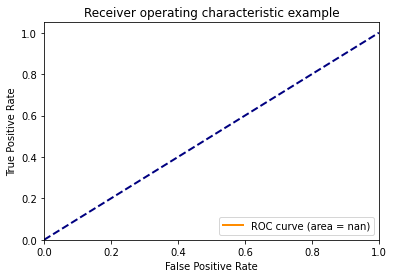

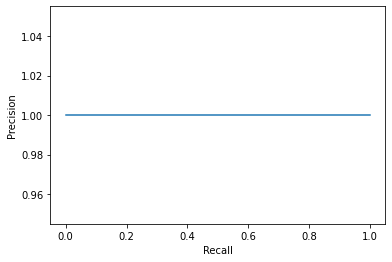

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.89      0.94       441

    accuracy                           0.89       441
   macro avg       0.50      0.45      0.47       441
weighted avg       1.00      0.89      0.94       441



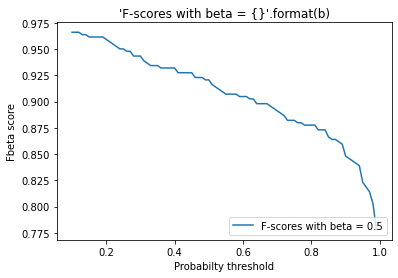

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/roadway-flooding-with-classes.csv",threshold=0.7)

ValueError: ignored

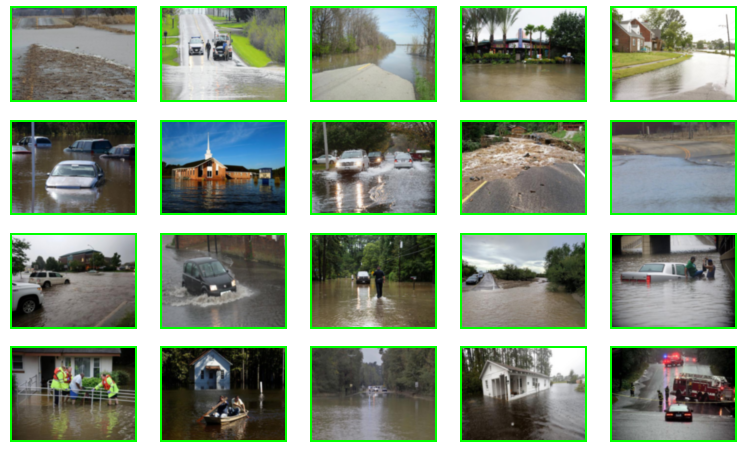

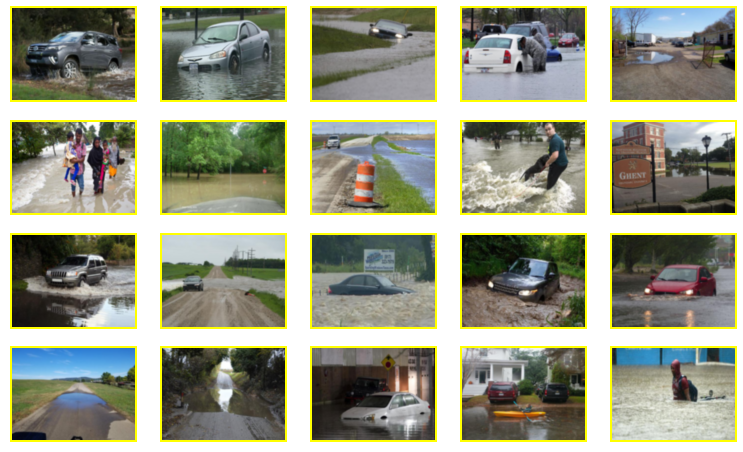

In [ ]:
show_pred_img("/content/drive/My Drive/Thesis/model/roadway-flooding-with-classes.csv","/content/Dataset/images/",0.9)

## 5.3&nbsp;City problems dataset

### 5.3.1&nbsp;Prediction

In [ ]:
dataset_folder = "/content/train/train/"
image_size = (512,512)
results = {}

i = 0
image_filenames = next(os.walk(dataset_folder))[2]
print(image_filenames)
print(dataset_folder);
for image_name in image_filenames:
  i+=1
  print(i)
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  img_array = np.array(pil_image)
  img_array = np.expand_dims(img_array, 0)
  img_array = preprocess_input(img_array)
  prediction = model.predict(img_array)
  print(str(i)+'/'+str(len(image_filenames)), end="\r")
  results[image_name] = prediction

In [ ]:
# to_write = pd.DataFrame(columns = ['id' ,'prob_flood','prob_not_flood'])
# to_write = to_write.set_index("id")
# for key,value in results.items():
#   to_write = to_write.append({'id' : key, 'prob_flood':value[0][0],'prob_not_flood':value[0][1]}, ignore_index=True )
# to_write.to_csv("/content/drive/My Drive/Thesis/model/city-problems-results.csv")

In [ ]:
to_write = pd.read_csv("/content/drive/My Drive/Thesis/model/city-problems-results.csv")
to_write = to_write.set_index("id")
true_classes = pd.read_csv("/content/train.csv")
true_classes.set_index("image_id")
to_write = pd.merge(to_write, true_classes, left_on='id', right_on='image_id', how='left')
to_write['class_binary'] = to_write['label'].apply(lambda x: 1 if x==3 else 0)
to_write.to_csv("/content/drive/My Drive/Thesis/model/city-problems-with-classes.csv") 

In [ ]:
to_write.head()

,Unnamed: 0,prob_flood,prob_not_flood,image_id,label,class_binary
0,0,0.999283,7.170212e-04,6219.jpg,2,0
1,1,0.058120,9.418799e-01,1233.jpg,0,0
2,2,1.000000,9.226968e-10,11707.jpg,6,0
3,3,1.000000,2.622652e-11,7943.jpg,3,1
4,4,0.997724,2.276242e-03,9471.jpg,5,0


### 5.3.2&nbsp;Evalutaion

Unbalanced


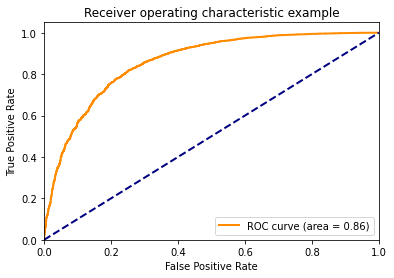

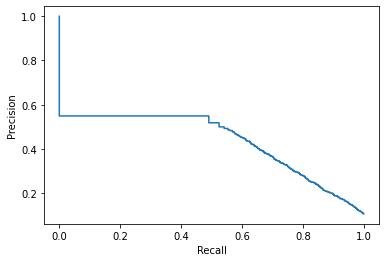

              precision    recall  f1-score   support

           0       0.98      0.51      0.67     13613
           1       0.18      0.92      0.30      1610

    accuracy                           0.55     15223
   macro avg       0.58      0.71      0.49     15223
weighted avg       0.90      0.55      0.63     15223



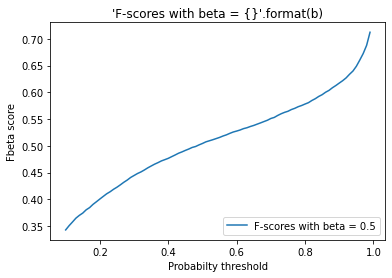

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/city-problems-with-classes.csv",threshold=general_treshold_original)

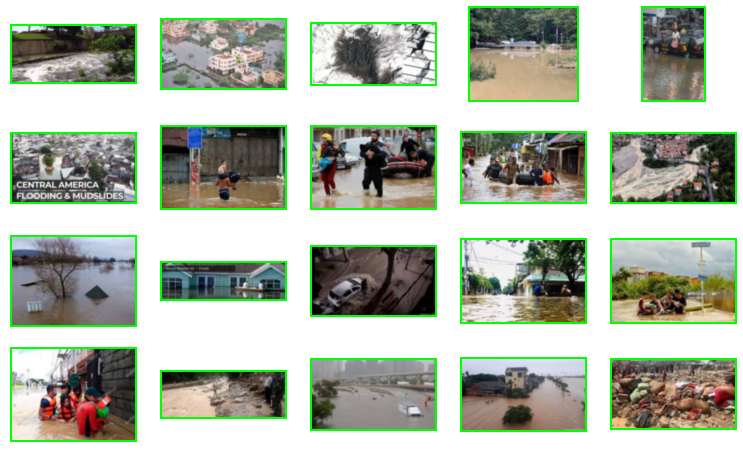

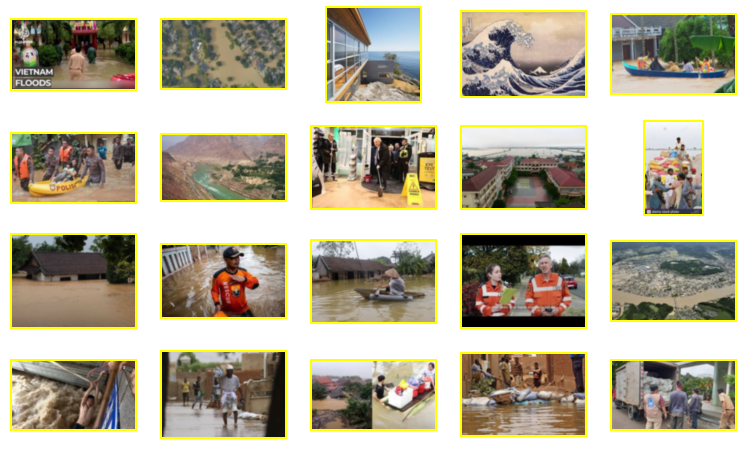

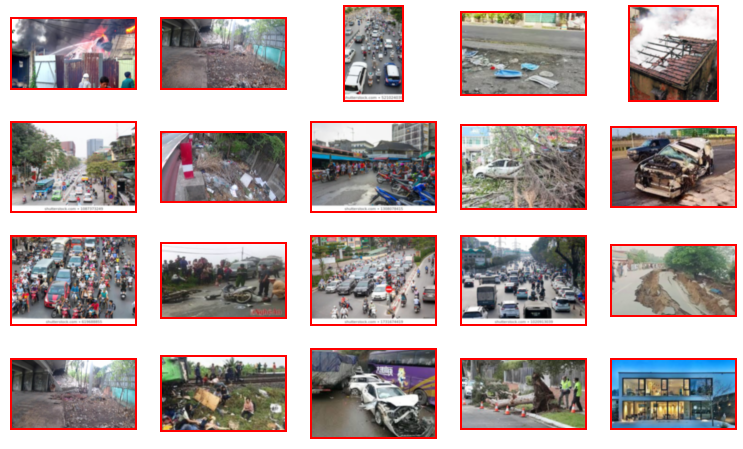

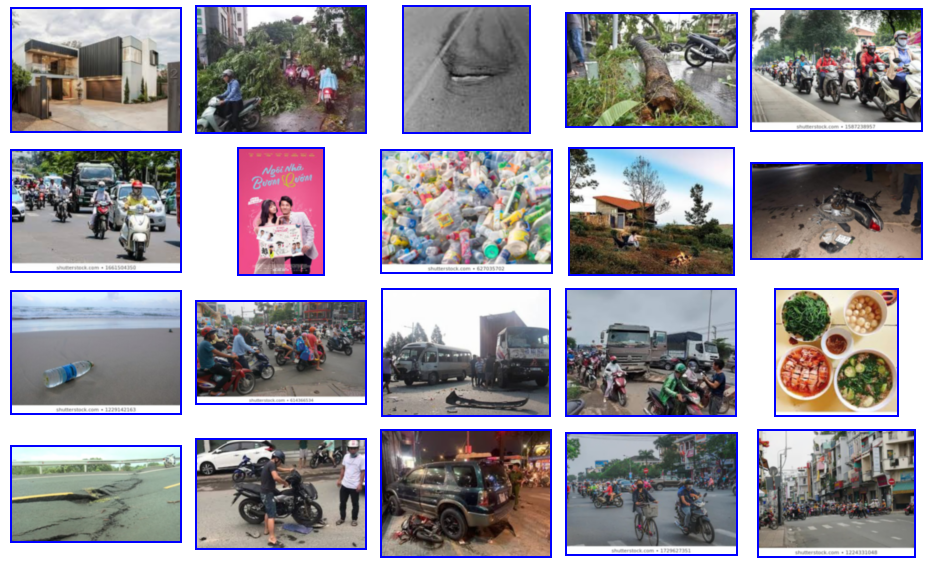

In [ ]:
show_pred_img("/content/drive/My Drive/Thesis/model/city-problems-with-classes.csv","/content/train/train/",general_treshold_original)

In [ ]:
wrong_predicted_by_classesCP("/content/drive/My Drive/Thesis/model/city-problems-with-classes.csv","/content/Cyclone_Wildfire_Flood_Earthquake_Database/",general_treshold_original)

   Unnamed: 0  Unnamed: 0.1  prob_flood  prob_not_flood   image_id  label  \
0           0             0    0.999283    7.170212e-04   6219.jpg      2   
1           1             1    0.058120    9.418799e-01   1233.jpg      0   
2           2             2    1.000000    9.226968e-10  11707.jpg      6   
3           3             3    1.000000    2.622652e-11   7943.jpg      3   
4           4             4    0.997724    2.276242e-03   9471.jpg      5   

   class_binary  
0             0  
1             0  
2             0  
3             1  
4             0  
no_event_amount =  3375
   false negatives: 911
   true negatives: 2464
fallen_tree_amount  =  1480
   false negatives: 975
   true negatives: 505
fire_amount =  1523
   false negatives: 745
   true negatives: 778
flooding_amount   =  1610
   true positives: 1423
   false positives: 187
bad_road_amount    =  1068
   false negatives: 539
   true negatives: 529
traffic_jam_amount =  2185
   false negatives: 883
   true negative

NameError: ignored

## 5.4&nbsp;Twitter dataset

### 5.4.1&nbsp;Prediction

In [ ]:
data = None
data1 = None
twit_dataset = pd.DataFrame(columns = ['id','URL' , 'Class'])
with open("/content/drive/My Drive/Thesis/model/harz17.json", "r") as read_file:
    data = json.load(read_file)
with open("/content/drive/My Drive/Thesis/model/rhine18.json", "r") as read_file:
    data1 = json.load(read_file)
json_string = json.dumps(data)
json_string1 = json.dumps(data1)
for i in data1:
  twit_dataset = twit_dataset.append({'id':i,'URL' : data1[i]['URL'], 'Class':("1" if data1[i]['RelFlooding'] else "0")}, ignore_index=True )

for i in data:
  twit_dataset = twit_dataset.append({'id':i,'URL' : data[i]['URL'], 'Class':("1" if data[i]['RelFlooding'] else "0")}, ignore_index=True )

twit_dataset.head(10)
twit_dataset.to_csv("/content/drive/My Drive/Thesis/model/url_dataset.csv")

In [ ]:
len_df = twit_dataset.shape[0]
for i in range(len_df):
  p = requests.get(twit_dataset['URL'].loc[i])
  out = open("/content/drive/My Drive/Thesis/model/twitter_dataset/{}.jpg".format(twit_dataset['id'].loc[i]), "wb")
  out.write(p.content)
  out.close()

In [ ]:
dataset_folder = "/content/drive/My Drive/Thesis/model/twitter_dataset/"
image_size = (512,512)
image_filenames = twit_dataset['id']
print(image_filenames)
results = {}
err = 0
i = 0
for image_name in image_filenames:
  i+=1
  try:
    pil_image = Image.open(dataset_folder + image_name+'.jpg').convert('RGB')
    pil_image = pil_image.resize((512, 512))
    img_array = np.array(pil_image)
    img_array = np.expand_dims(img_array, 0)
    img_array = preprocess_input(img_array)
    prediction = model.predict(img_array)
    print(str(i)+'/'+str(len(image_filenames)))
    results[image_name] = prediction
  except:
    err+=1
    print("err: " + str(err))

In [ ]:
to_write = pd.DataFrame(columns = ['id' ,'prob_flood','prob_not_flood','threshold(50%)'])
for key,value in results.items():
  to_write = to_write.append({'id' : key, 'prob_flood':value[0][0],'prob_not_flood':value[0][1]}, ignore_index=True )

to_write.head()
to_write.to_csv("/content/drive/My Drive/Thesis/model/twit_dataset.csv",index=False) #(1390, 6)

### 5.4.2&nbsp;Evaluation

In [ ]:
def make_image_id(name,class_binary):
  return str(class_binary)+"/"+name+".jpg"

data = pd.read_csv("/content/drive/My Drive/Thesis/model/twit_dataset-full.csv")
# data.to_csv("/content/drive/My Drive/Thesis/model/twit_dataset-full.csv",index=False)
data['image_id'] = data.apply(lambda x: make_image_id(x.id, x.class_binary), axis=1)
data = data.drop(columns=["id","threshold(50%)","URL",])
data["prob_flood"] = pd.to_numeric(data["prob_flood"])
data["prob_not_flood"] = pd.to_numeric(data["prob_not_flood"])
data.to_csv("/content/drive/My Drive/Thesis/model/twit_dataset-with-classes.csv",index=False)

In [ ]:
twit_dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/twit_dataset.csv")
url_dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/url_dataset.csv")
twit_dataset = twit_dataset.drop(columns=["Unnamed: 0"])
url_dataset = url_dataset.drop(columns=["Unnamed: 0"])
conc_dataset = twit_dataset.set_index('id').join(url_dataset.set_index('id'))
conc_dataset = conc_dataset.rename(columns={"Class": "class_binary"})
conc_dataset.to_csv("/content/drive/My Drive/Thesis/model/twit_dataset-with-classes.csv",index=False)

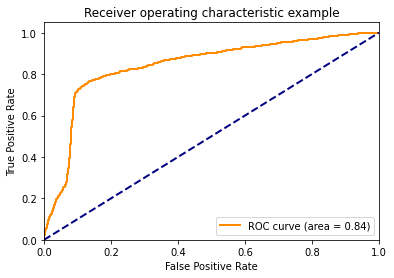

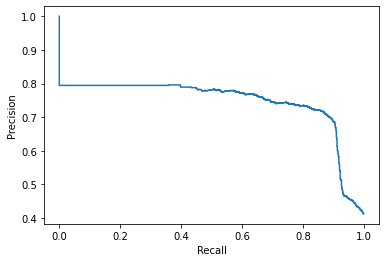

              precision    recall  f1-score   support

           0       0.88      0.77      0.82      1390
           1       0.72      0.85      0.78       959

    accuracy                           0.80      2349
   macro avg       0.80      0.81      0.80      2349
weighted avg       0.82      0.80      0.81      2349



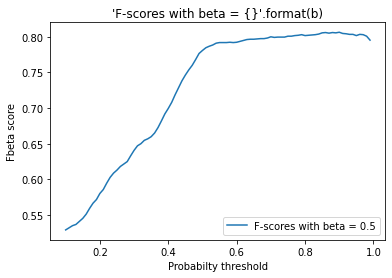

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/twit_dataset-with-classes.csv",general_treshold_original)

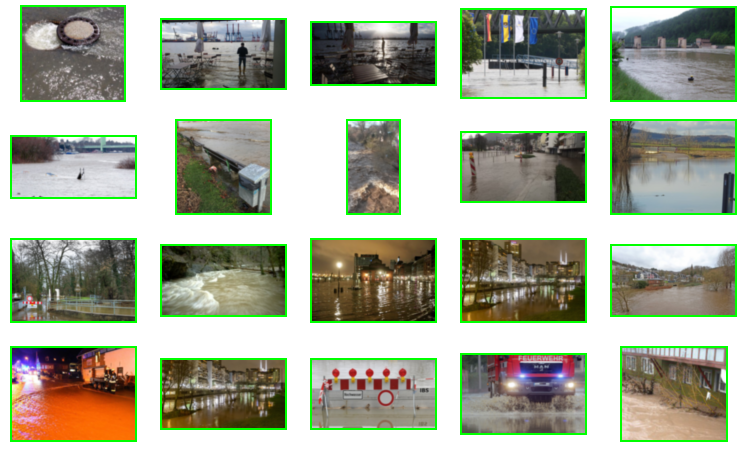

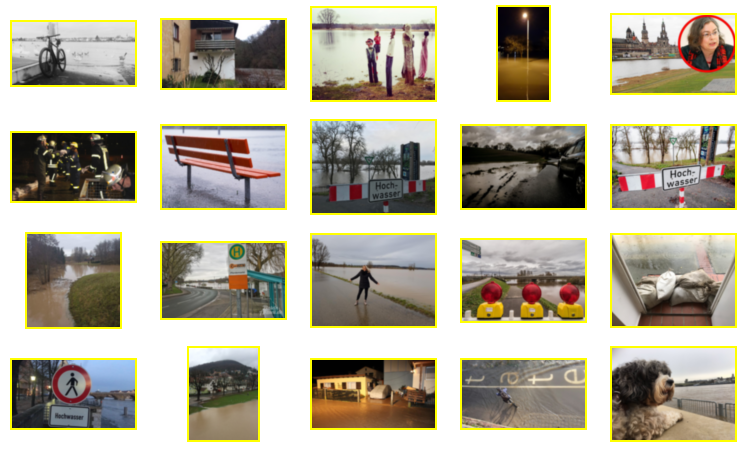

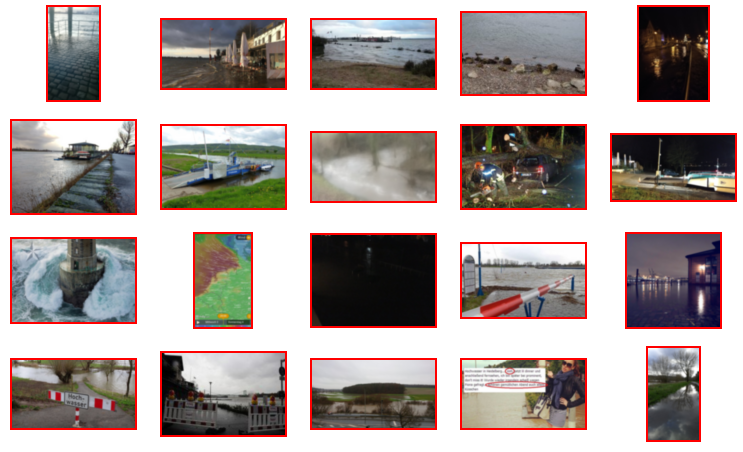

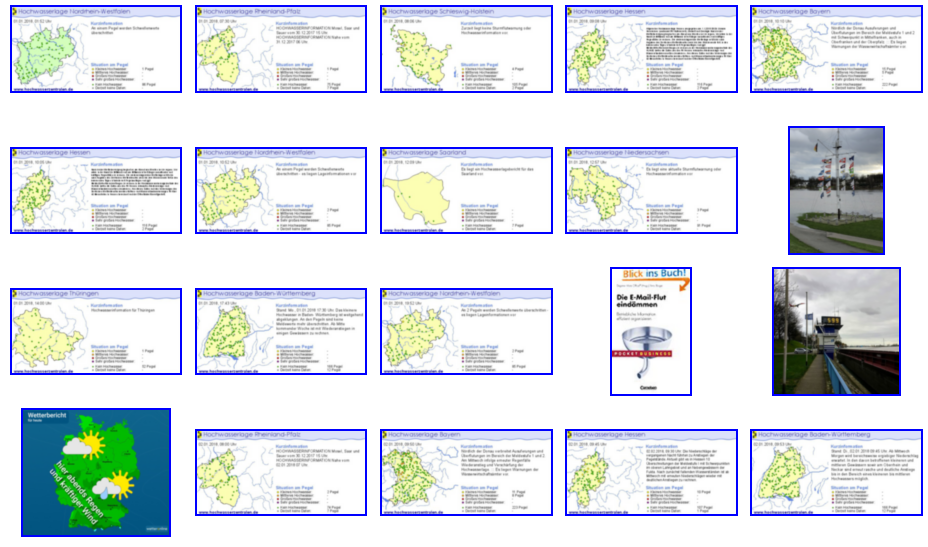

In [ ]:
show_pred_img("/content/drive/My Drive/Thesis/model/twit_dataset-with-classes.csv","/content/drive/My Drive/Thesis/model/twitter_dataset/",general_treshold_original)

## 5.5&nbsp;Scene classification dataset

### 5.5.1&nbsp; Prediction

In [ ]:
data = pd.read_csv("/content/train-scene classification/train.csv")
data.describe()

,label
count,17034.000000
mean,2.543208
std,1.684829
min,0.000000
25%,1.000000
50%,3.000000
75%,4.000000
max,5.000000


In [ ]:
#Buildings Forests Mountains Glacier Street Sea
dataset_folder = "/content/train-scene classification/train/"
image_size = (512,512)
results = {}
i = 0
image_filenames = next(os.walk(dataset_folder))[2]
for image_name in image_filenames:
  i+=1
  print(i,len(image_filenames))
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  img_array = np.array(pil_image)
  img_array = np.expand_dims(img_array, 0)
  img_array = preprocess_input(img_array)
  prediction = model.predict(img_array)
  print(str(i)+'/'+str(len(image_filenames)), end="\r")
  results[image_name] = prediction

In [ ]:
to_write = pd.DataFrame(columns = ['id' ,'prob_flood','prob_not_flood'])
for key,value in results.items():
  to_write = to_write.append({'id' : key, 'prob_flood':value[0][0],'prob_not_flood':value[0][1]}, ignore_index=True )
to_write.to_csv("/content/drive/My Drive/Thesis/model/scene-classification-results.csv", index=False)

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/scene-classification-results.csv")
data1 = pd.read_csv("/content/train-scene classification/train.csv")
data = data.set_index("id")
data1 = data1.rename(columns={"image_name":"id"})
data1 = data1.set_index("id")
data = data.merge(data1, left_on='id', right_on='id')
data["class_binary"] = 0
data.to_csv("/content/drive/My Drive/Thesis/model/scene-classification-with-classes.csv")

### 5.5.2&nbsp;Evaluation

In [ ]:
data[data["prob_flood"]>0.9].describe()

,prob_flood,prob_not_flood,label,class_binary
count,5610.000000,5.610000e+03,5610.000000,5610.0
mean,0.983866,1.613377e-02,2.866667,0.0
std,0.024908,2.490830e-02,2.000101,0.0
min,0.900146,2.909080e-22,0.000000,0.0
25%,0.977922,7.308832e-05,1.000000,0.0
50%,0.997338,2.661852e-03,4.000000,0.0
75%,0.999927,2.207791e-02,5.000000,0.0
max,1.000000,9.985448e-02,5.000000,0.0


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,


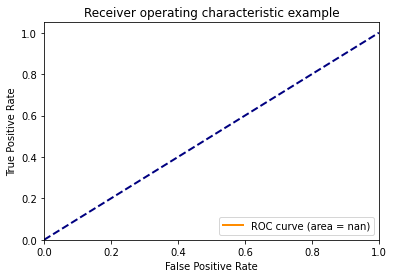

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


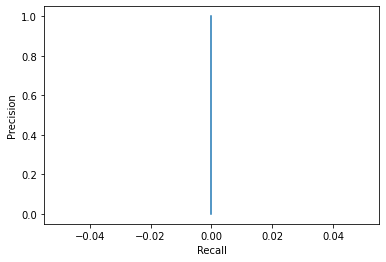

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      0.68      0.81     17034
           1       0.00      0.00      0.00         0

    accuracy                           0.68     17034
   macro avg       0.50      0.34      0.41     17034
weighted avg       1.00      0.68      0.81     17034



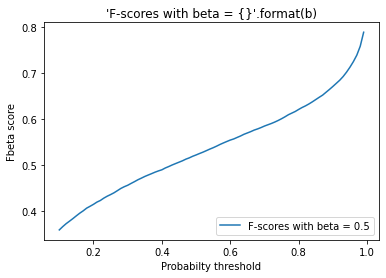

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/scene-classification-with-classes.csv",general_treshold_original)

In [ ]:
wrong_predicted_by_classesSC("/content/drive/My Drive/Thesis/model/scene-classification-with-classes.csv","/content/train-scene classification/train",general_treshold_original)

         id  prob_flood  prob_not_flood  label  class_binary
0   330.jpg    0.998090        0.001910      5             0
1  6104.jpg    0.999516        0.000484      1             0
2  8970.jpg    0.996493        0.003507      5             0
3  9709.jpg    0.999897        0.000103      4             0
4  2740.jpg    0.371881        0.628119      4             0
buildings_amount =  2628
   false negatives: 818
   true negatives: 1810
forests_amount   =  2745
   false negatives: 1264
   true negatives: 1481
mountains_amount =  2957
   false negatives: 406
   true negatives: 2551
glacier_amount   =  3037
   false negatives: 94
   true negatives: 2943
street_amount    =  2784
   false negatives: 790
   true negatives: 1994
sea_amount       =  2883
   false negatives: 2008
   true negatives: 875


# 6.&nbsp; Prediction and evaluation for additionally trained Xception

## 6.1&nbsp; Model initialization from callback

In [ ]:
model2 = keras.models.load_model('/content/drive/My Drive/Thesis/new_train_callbacks/epoch_33.h5', compile=False)
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 16, 16, 2048)      20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 2)                 4098      
                                                                 
Total params: 20,865,578
Trainable params: 4,098
Non-trainable params: 20,861,480
_________________________________________________________________


## 6.2&nbsp; CWFE dataset

Function for predict images from pandas dataset (not from directory)

In [ ]:
def pandas_prediction(x):
  pil_image = Image.open(x).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  img_array = np.array(pil_image)
  img_array = np.expand_dims(img_array, 0)
  img_array = preprocess_input(img_array)
  prediction = model2.predict(img_array)
  return prediction[0][1]

### 6.2.1&nbsp; Prediction for whole dataset

In [ ]:
dataset_folder = "/content/Cyclone_Wildfire_Flood_Earthquake_Database/"
image_size = (512,512)
results = {}
for class_dir in ['Cyclone/','Earthquake/','Flood/','Wildfire/']:
  i = 0
  image_filenames = next(os.walk(dataset_folder+class_dir))[2]
  print(len(image_filenames))
  print(dataset_folder+class_dir);
  for image_name in image_filenames:
    pil_image = Image.open(dataset_folder +class_dir+ image_name).convert('RGB')
    pil_image = pil_image.resize((512, 512))
    img_array = np.array(pil_image)
    img_array = np.expand_dims(img_array, 0)
    img_array = preprocess_input(img_array)
    prediction = model2.predict(img_array)
    results[class_dir+image_name] = prediction

In [ ]:
#почему - то перепутаны классы
to_write = pd.DataFrame(columns = ['id' ,'prob_not_flood','prob_flood'])
for key,value in results.items():
  to_write = to_write.append({'id' : key, 'prob_not_flood':value[0][0],'prob_flood':value[0][1]}, ignore_index=True )
to_write.to_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-results-new-model.csv", index=False)

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-results-new-model.csv")
print(data.head())
data["class_binary"] = data["id"].apply(lambda x: 1 if x[0]=="F" else 0)
data.rename(columns={"id":"image_id"})
data.to_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes-new-model.csv", index=False)

### 6.2.2&nbsp; Evaluation for whole dataset

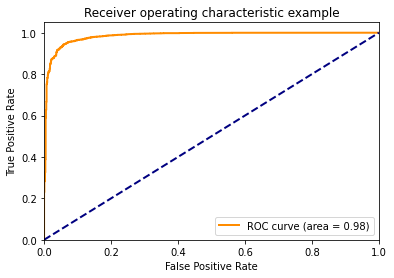

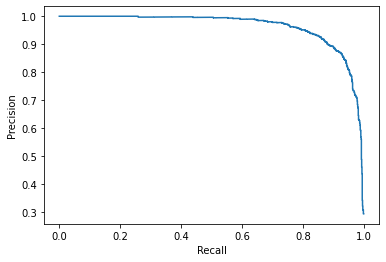

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      3355
           1       0.93      0.85      0.89      1073

    accuracy                           0.95      4428
   macro avg       0.94      0.91      0.93      4428
weighted avg       0.95      0.95      0.95      4428



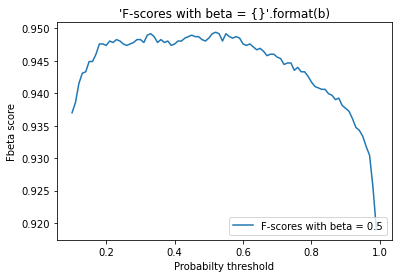

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes-new-model.csv",threshold=general_treshold_trained)

### 6.2.3&nbsp;Evaluation for samples non included in additional training

In [ ]:
test_dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/test-additional-dataset.csv")
print(test_dataset.shape)
cyclone_test = test_dataset[test_dataset["id"].str.find("Cyclone_Wildfire") != -1]
print(cyclone_test.shape)

(21416, 3)
(2211, 3)


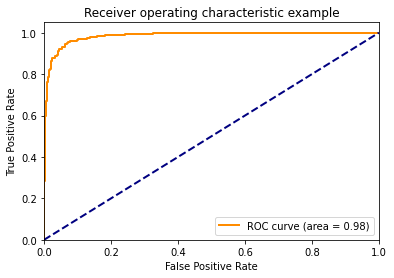

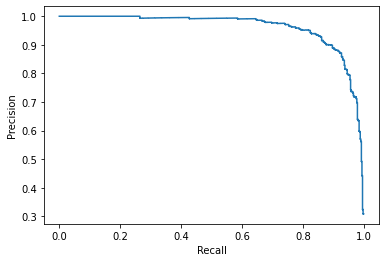

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      1675
           1       0.94      0.85      0.89       536

    accuracy                           0.95      2211
   macro avg       0.94      0.91      0.93      2211
weighted avg       0.95      0.95      0.95      2211



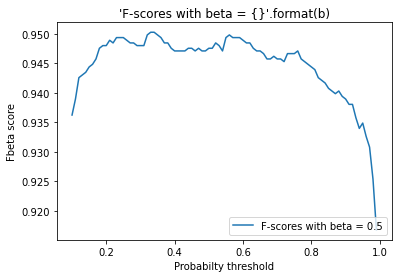

In [ ]:
evaluation("/content/drive/MyDrive/Thesis/model/cyclone-wildfire-with-classes-new-model-test.csv",threshold=general_treshold_trained)

#### 6.2.3.1&nbsp; No need to run this - CWFE gerator prediction(different version of prediction) 

In [ ]:
# img_generator = keras.preprocessing.image.ImageDataGenerator(
#     featurewise_center=True, featurewise_std_normalization=False,
# )
# pred = model2.predict_generator(img_generator.flow_from_dataframe(
#         cyclone_test, class_mode=None, shuffle=False, x_col="id",
#          target_size=(512,512), batch_size=8
# ), verbose=True, workers=8, use_multiprocessing=True, max_queue_size=32)
# print(pred)

In [ ]:
# for_scv = pd.DataFrame(columns = ['prob_flood','prob_not_flood'])
# for p in pred:
#   for_scv = for_scv.append({'prob_flood' : p[0], 'prob_not_flood':p[1]}, ignore_index=True )
# for_scv.to_csv("/content/drive/MyDrive/Thesis/model/new-model-test-batches-Cyclone-probabilities.csv",index=True)

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Thesis/model/new-model-test-Cyclone-probabilities.csv")
print(data.shape)
data = data.merge(cyclone_test)
print(cyclone_test[cyclone_test["flood"]!=0].shape)
data = data.rename(columns={"flood":"class_binary"})
print(data.head())
data.to_csv("/content/drive/MyDrive/Thesis/model/cyclone-wildfire-with-classes-new-model-test.csv")

(2211, 3)
(536, 3)
   Unnamed: 0    prob_flood  prob_not_flood  \
0           0  1.000000e+00    0.000000e+00   
1           1  1.000000e+00    1.837219e-23   
2           2  1.000000e+00    0.000000e+00   
3           3  1.000000e+00    0.000000e+00   
4           4  3.196917e-20    1.000000e+00   

                                                  id  class_binary  
0  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...             0  
1  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...             0  
2  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...             0  
3  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...             0  
4  /content/Cyclone_Wildfire_Flood_Earthquake_Dat...             0  


### 6.2.4&nbsp;Prediction and evaluation for samples non included in additional training (If you want to wait less time and do not need to evaluate all dataset)

In [ ]:
test_dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/test-additional-dataset.csv")
data = test_dataset[test_dataset["id"].str.find("Cyclone_Wildfire") != -1]
print("Data shape: ",data.shape)
print("Floods: ", data[data['flood']==1].shape)

data["prob_flood"] = data["id"].apply(pandas_prediction)
data["prob_not_flood"] = data["prob_flood"].apply(lambda x: 1-x)
data.head()
data = data.rename(columns={"flood":"class_binary"})
data.to_csv("/content/drive/MyDrive/Thesis/model/cyclone-wildfire-with-classes-new-model-test.csv")

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Thesis/model/cyclone-wildfire-with-classes-new-model-test.csv")
data.head()
data = data.rename(columns={"prob_flood1":"prob_not_flood","prob_not_flood1":"prob_flood"})

# data = data.rename(columns={"prob_flood":"prob_not_flood1"})
# data = data.rename(columns={"prob_not_flood":"prob_flood1"})
# data = data.rename(columns={"prob_flood1":"prob_flood","prob_not_flood":"prob_not_flood1"})
data.to_csv("/content/drive/MyDrive/Thesis/model/cyclone-wildfire-with-classes-new-model-test.csv")

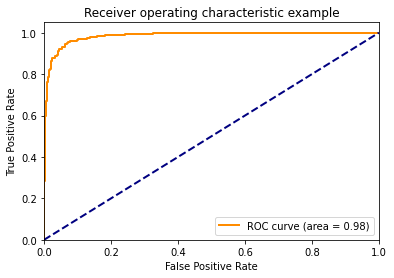

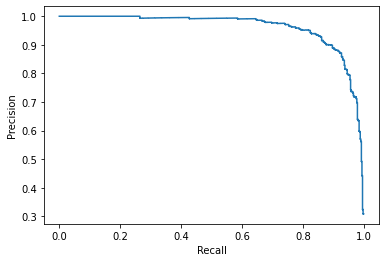

              precision    recall  f1-score   support

           0       0.90      1.00      0.95      1675
           1       0.99      0.67      0.80       536

    accuracy                           0.92      2211
   macro avg       0.94      0.83      0.87      2211
weighted avg       0.92      0.92      0.91      2211



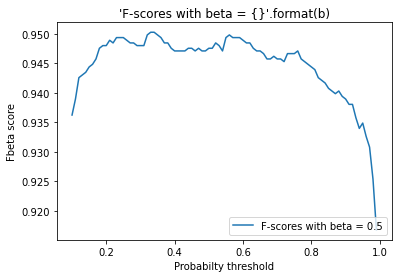

In [ ]:
evaluation("/content/drive/MyDrive/Thesis/model/cyclone-wildfire-with-classes-new-model-test.csv",threshold=general_treshold_trained)

## 6.3&nbsp;City problems dataset

### 6.3.1&nbsp; Prediction

In [ ]:
test_dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/test-additional-dataset.csv")
data = test_dataset[test_dataset["id"].str.find("/content/train/train/") != -1]

print("Data shape: ",data.shape)
print("Floods: ", data[data['flood']==1].shape)

data["prob_flood"] = data["id"].apply(pandas_prediction)
data["prob_not_flood"] = data["prob_flood"].apply(lambda x: 1-x)
data.head()
data = data.rename(columns={"flood":"class_binary"})
data.to_csv("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv")

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv")
data.head()
data = data.rename(columns={"prob_flood":"prob_not_flood1","prob_not_flood":"prob_flood1"})
data = data.rename(columns={"prob_flood1":"prob_flood","prob_not_flood1":"prob_not_flood"})
data.to_csv("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv")

### 6.3.2&nbsp; Evaluation

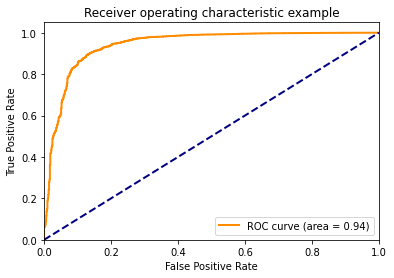

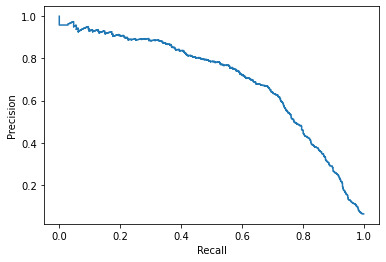

              precision    recall  f1-score   support

           0       0.99      0.88      0.93     12913
           1       0.32      0.88      0.47       805

    accuracy                           0.88     13718
   macro avg       0.66      0.88      0.70     13718
weighted avg       0.95      0.88      0.91     13718



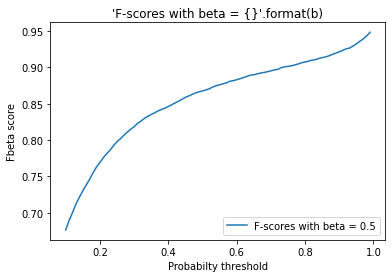

In [ ]:
evaluation("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv",threshold=general_treshold_trained)

## 6.4&nbsp; Twitter dataset

Note: the process of prediction a bit different from the previous one for Twitter dataset. Because for another notebook we need divide classes into two subfolder /0 and /1

### 6.4.1&nbsp; Prediction

In [ ]:
dataset_folder = "/content/drive/My Drive/Thesis/model/twitter_dataset/"
image_size = (512,512)
twit_dataset = pd.read_csv("/content/drive/My Drive/Thesis/model/url_dataset.csv")
image_filenames = twit_dataset['id']
print(image_filenames)
results = {}
fullpath = ""
err = 0
pil_image = None
true_class = None
i = 0
for image_name in image_filenames:
  i+=1
  try:
    try:
      fullpath = dataset_folder + "0/"+ image_name+'.jpg'
      pil_image = Image.open(fullpath).convert('RGB')
      true_class = 0
    except:
      fullpath = dataset_folder + "1/"+ image_name+'.jpg'
      pil_image = Image.open(fullpath).convert('RGB')
      true_class = 1
    finally:
      pil_image = pil_image.resize((512, 512))
      img_array = np.array(pil_image)
      img_array = np.expand_dims(img_array, 0)
      img_array = preprocess_input(img_array)
      prediction = model2.predict(img_array)
      print(str(i)+'/'+str(len(image_filenames)))
      results[image_name] = (prediction, true_class)
  except:
    err+=1
    print("err: " + str(err))

Выходные данные были обрезаны до нескольких последних строк (5000).
148/2552
1/1 [==============================] - 0s 22ms/step
149/2552
err: 13
1/1 [==============================] - 0s 22ms/step
150/2552
err: 14
1/1 [==============================] - 0s 25ms/step
151/2552
1/1 [==============================] - 0s 24ms/step
152/2552
1/1 [==============================] - 0s 24ms/step
153/2552
err: 15
1/1 [==============================] - 0s 21ms/step
154/2552
1/1 [==============================] - 0s 21ms/step
155/2552
1/1 [==============================] - 0s 23ms/step
156/2552
1/1 [==============================] - 0s 20ms/step
157/2552
err: 16
1/1 [==============================] - 0s 21ms/step
158/2552
1/1 [==============================] - 0s 21ms/step
159/2552
1/1 [==============================] - 0s 21ms/step
160/2552
1/1 [==============================] - 0s 21ms/step
161/2552
1/1 [==============================] - 0s 21ms/step
162/2552
1/1 [==============================] 

In [ ]:
to_write = pd.DataFrame(columns = ['id' ,'prob_flood','prob_not_flood','class_binary'])
for key,value in results.items():
  to_write = to_write.append({'id' : key, 'prob_flood':value[0][0][0],'prob_not_flood':value[0][0][1], "class_binary":value[1]}, ignore_index=True )

to_write.to_csv("/content/drive/My Drive/Thesis/model/new-twit_dataset-results-test.csv",index=False) #(1390, 6)

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/new-twit_dataset-results-test.csv")
data.head()
data = data.rename(columns={"prob_flood":"prob_not_flood1","prob_not_flood":"prob_flood1"})
data = data.rename(columns={"prob_flood1":"prob_flood","prob_not_flood1":"prob_not_flood"})
data.to_csv("/content/drive/My Drive/Thesis/model/new-twit_dataset-results-test.csv")

In [ ]:
df_new = pd.read_csv("/content/drive/My Drive/Thesis/model/new-twit_dataset-results-test.csv")
df_old = pd.read_csv("/content/drive/My Drive/Thesis/model/resnet-twit_dataset-with-classes.csv")
print(df_new.shape)
print(df_old.shape)
df_new = df_new.rename(columns={"id":"cid"})
df_old["cid"] = df_old.image_id.apply(lambda x: str(x).split('/')[-1][:-4])
df_c = pd.merge(df_new,df_old[['cid',"image_id"]],on='cid')
df_c.to_csv("/content/drive/My Drive/Thesis/model/new-twit_dataset-with-classes.csv")

(2552, 5)
(2349, 4)


In [ ]:
fii1 = pd.read_csv("/content/drive/My Drive/Thesis/model/resnet-twit_dataset-with-classes.csv")
fii1.head(5)

,prob_flood,prob_not_flood,image_id,class_binary
0,0.022795,0.977205,/content/drive/MyDrive/Thesis/model/twitter_da...,0
1,0.965548,0.034452,/content/drive/MyDrive/Thesis/model/twitter_da...,0
2,0.182341,0.817659,/content/drive/MyDrive/Thesis/model/twitter_da...,0
3,0.066874,0.933126,/content/drive/MyDrive/Thesis/model/twitter_da...,0
4,0.114453,0.885547,/content/drive/MyDrive/Thesis/model/twitter_da...,0


### 6.4.2&nbsp; Evaluation

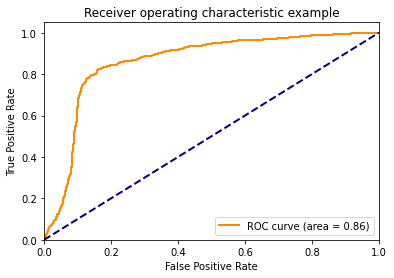

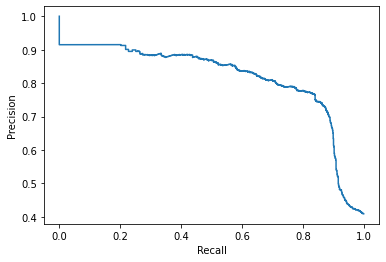

              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1390
           1       0.78      0.81      0.79       959

    accuracy                           0.83      2349
   macro avg       0.82      0.82      0.82      2349
weighted avg       0.83      0.83      0.83      2349



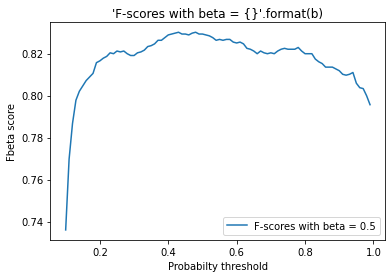

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/new-twit_dataset-with-classes.csv",threshold=general_treshold_trained)

In [ ]:
df = pd.read_csv("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes-new-model.csv")
df.head()

,id,prob_not_flood,prob_flood,class_binary
0,Cyclone/56.jpg,1.000000,7.294254e-08,0
1,Cyclone/149.jpg,0.999521,4.794675e-04,0
2,Cyclone/609.jpg,0.995684,4.316014e-03,0
3,Cyclone/731.jpg,1.000000,1.359322e-07,0
4,Cyclone/509.jpg,0.916347,8.365260e-02,0


In [ ]:
fi1 = pd.read_csv("/content/drive/My Drive/Thesis/model/city-problems-with-classes.csv")
fi1.head()

,Unnamed: 0,Unnamed: 0.1,prob_flood,prob_not_flood,image_id,label,class_binary
0,0,0,0.999283,7.170212e-04,6219.jpg,2,0
1,1,1,0.058120,9.418799e-01,1233.jpg,0,0
2,2,2,1.000000,9.226968e-10,11707.jpg,6,0
3,3,3,1.000000,2.622652e-11,7943.jpg,3,1
4,4,4,0.997724,2.276242e-03,9471.jpg,5,0


In [ ]:
fi2 = pd.read_csv("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv")
fi2["image_id"] = fi2["id"].apply(lambda x: str(x).split('/')[-1])
fnew = fi1[['image_id','label']]
fi2 = fi2.merge(fnew) 
fi2 = fi2.drop(columns=["Unnamed: 0",	"Unnamed: 0.1",	'Unnamed: 0.1.1'])
fi2.head()
fi2.to_csv("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv")

In [ ]:
wrong_predicted_by_classesCEWF("/content/drive/My Drive/Thesis/model/cyclone-wildfire-with-classes-new-model.csv","/content/Cyclone_Wildfire_Flood_Earthquake_Database/",general_treshold_trained)

                id  prob_not_flood    prob_flood  class_binary
0   Cyclone/56.jpg        1.000000  7.294254e-08             0
1  Cyclone/149.jpg        0.999521  4.794675e-04             0
2  Cyclone/609.jpg        0.995684  4.316014e-03             0
3  Cyclone/731.jpg        1.000000  1.359322e-07             0
4  Cyclone/509.jpg        0.916347  8.365260e-02             0
cycle_amount = 928
earth_amount = 1350
flood_amount = 1073
fire_amount = 1077
False negatives
Cyclone:  0
Wildfire:  0
Earthquake:  0
Flood:  166
False positives
Cyclone:  4
Wildfire:  2
Earthquake:  60
Flood:  0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


NameError: ignored

In [ ]:
wrong_predicted_by_classesCP("/content/drive/MyDrive/Thesis/model/city-problems-with-classes-new-model-test.csv","/content/Cyclone_Wildfire_Flood_Earthquake_Database/",general_treshold_trained)

   Unnamed: 0                             id  class_binary  prob_not_flood  \
0           0  /content/train/train/7183.jpg             1    7.108604e-04   
1           1  /content/train/train/7184.jpg             1    9.009015e-04   
2           2  /content/train/train/7185.jpg             1    2.940053e-05   
3           3  /content/train/train/7186.jpg             1    9.759213e-11   
4           4  /content/train/train/7187.jpg             1    1.354297e-01   

   prob_flood  image_id  label  
0    0.999289  7183.jpg      3  
1    0.999099  7184.jpg      3  
2    0.999971  7185.jpg      3  
3    1.000000  7186.jpg      3  
4    0.864570  7187.jpg      3  
no_event_amount =  3275
   false negatives: 653
   true negatives: 2622
fallen_tree_amount  =  1380
   false negatives: 283
   true negatives: 1097
fire_amount =  1423
   false negatives: 14
   true negatives: 1409
flooding_amount   =  805
   true positives: 705
   false positives: 100
bad_road_amount    =  968
   false negatives: 

NameError: ignored

## 6.5&nbsp; Scene classification dataset

### 6.5.1&nbsp; Prediction

In [ ]:
#Buildings Forests Mountains Glacier Street Sea
dataset_folder = "/content/train-scene classification/train/"
image_size = (512,512)
results = {}
i = 0
image_filenames = next(os.walk(dataset_folder))[2]
for image_name in image_filenames:
  i+=1
  print(i,len(image_filenames))
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  img_array = np.array(pil_image)
  img_array = np.expand_dims(img_array, 0)
  img_array = preprocess_input(img_array)
  prediction = model2.predict(img_array)
  print(str(i)+'/'+str(len(image_filenames)), end="\r")
  results[image_name] = prediction

In [ ]:
to_write = pd.DataFrame(columns = ['id' ,'prob_flood','prob_not_flood'])
for key,value in results.items():
  to_write = to_write.append({'id' : key, 'prob_flood':value[0][0],'prob_not_flood':value[0][1]}, ignore_index=True )
to_write.to_csv("/content/drive/My Drive/Thesis/model/new-model-scene-classification-results.csv", index=False)

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/new-model-scene-classification-results.csv")
data1 = pd.read_csv("/content/train-scene classification/train.csv")
data = data.set_index("id")
data1 = data1.rename(columns={"image_name":"id"})
data1 = data1.set_index("id")
data = data.merge(data1, left_on='id', right_on='id')
data["class_binary"] = 0
data.to_csv("/content/drive/My Drive/Thesis/model/new-model-scene-classification-with-classes.csv")

In [ ]:
data = pd.read_csv("/content/drive/My Drive/Thesis/model/new-model-scene-classification-with-classes.csv")
data.head()
data = data.rename(columns={"prob_flood":"prob_not_flood1","prob_not_flood":"prob_flood1"})
data = data.rename(columns={"prob_flood1":"prob_flood","prob_not_flood1":"prob_not_flood"})
data.to_csv("/content/drive/My Drive/Thesis/model/new-model-scene-classification-with-classes.csv")

### 6.5.2&nbsp; Evaluation

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,


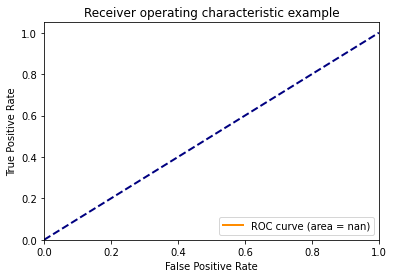

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


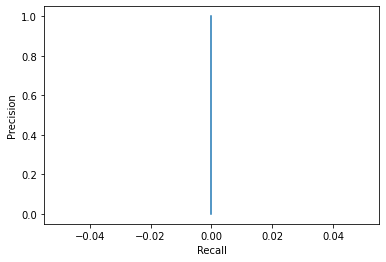

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      0.95      0.97     17034
           1       0.00      0.00      0.00         0

    accuracy                           0.95     17034
   macro avg       0.50      0.47      0.49     17034
weighted avg       1.00      0.95      0.97     17034



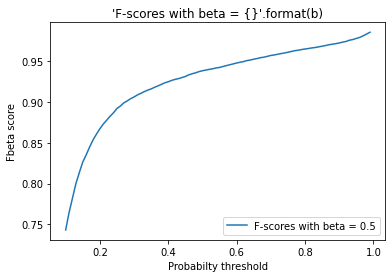

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/new-model-scene-classification-with-classes.csv",general_treshold_trained)

In [ ]:
wrong_predicted_by_classesSC("/content/drive/My Drive/Thesis/model/new-model-scene-classification-with-classes.csv","/content/train-scene classification/train",general_treshold_trained)

   Unnamed: 0         id  prob_not_flood  prob_flood  label  class_binary
0           0  20963.jpg        0.952912    0.047088      2             0
1           1   8960.jpg        0.955811    0.044189      3             0
2           2   8565.jpg        0.889150    0.110850      1             0
3           3   8819.jpg        0.624348    0.375652      4             0
4           4  19535.jpg        0.919734    0.080266      1             0
buildings_amount =  2628
   false negatives: 204
   true negatives: 2424
forests_amount   =  2745
   false negatives: 132
   true negatives: 2613
mountains_amount =  2957
   false negatives: 98
   true negatives: 2859
glacier_amount   =  3037
   false negatives: 73
   true negatives: 2964
street_amount    =  2784
   false negatives: 252
   true negatives: 2532
sea_amount       =  2883
   false negatives: 134
   true negatives: 2749


## 6.6&nbsp; Roadway flooding dataset

### 6.6.1&nbsp; Prediction

In [ ]:
dataset_folder = "/content/Dataset/images/"
image_size = (512,512)
results = {}

i = 0
image_filenames = next(os.walk(dataset_folder))[2]
print(image_filenames)
print(dataset_folder);
for image_name in image_filenames:
  i+=1
  print(i)
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  img_array = np.array(pil_image)
  img_array = np.expand_dims(img_array, 0)
  img_array = preprocess_input(img_array)
  print(str(i)+'/'+str(len(image_filenames)), end="\r")
  prediction = model2.predict(img_array)
  results[image_name] = prediction
to_write = pd.DataFrame(columns = ['image_id' ,'prob_flood','prob_not_flood'])
for key,value in results.items():
  to_write = to_write.append({'image_id' : key, 'prob_flood':value[0][1],'prob_not_flood':value[0][0]}, ignore_index=True )
to_write['class_binary'] = 1 
to_write.to_csv("/content/drive/My Drive/Thesis/model/new-model-roadway-flooding-with-classes.csv", index=False)

### 6.6.2&nbsp; Evaluation

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


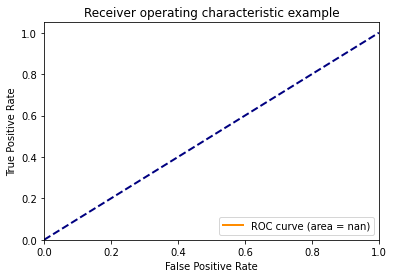

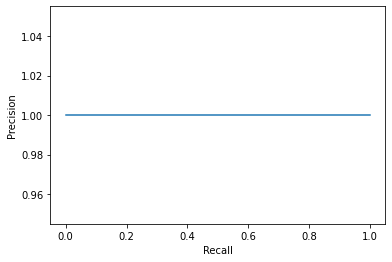

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.89      0.94       441

    accuracy                           0.89       441
   macro avg       0.50      0.45      0.47       441
weighted avg       1.00      0.89      0.94       441



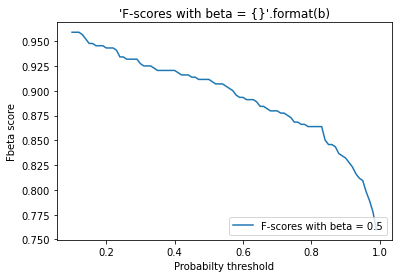

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/new-model-roadway-flooding-with-classes.csv",threshold=general_treshold_trained)

# 7&nbsp; Not important - additional evaluation for VGG and ResNet, additional prepations, image printing, etc.

0
0.jpg


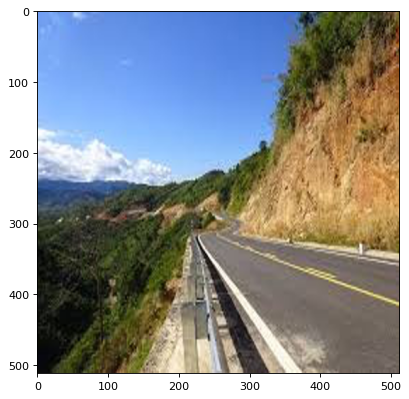

1
3375.jpg


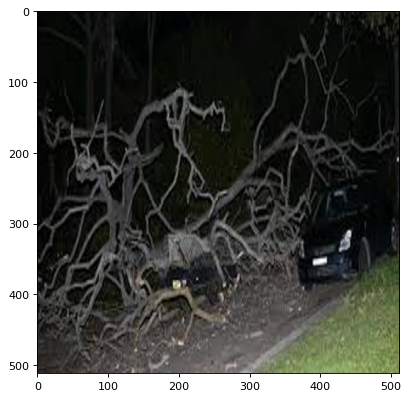

2
4855.jpg


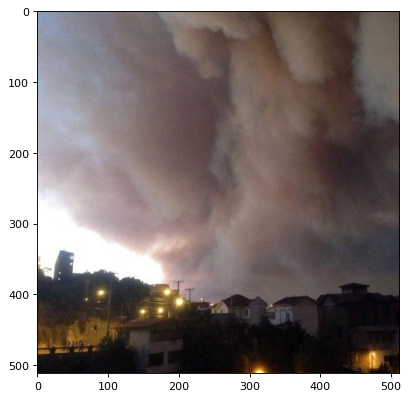

3
6378.jpg


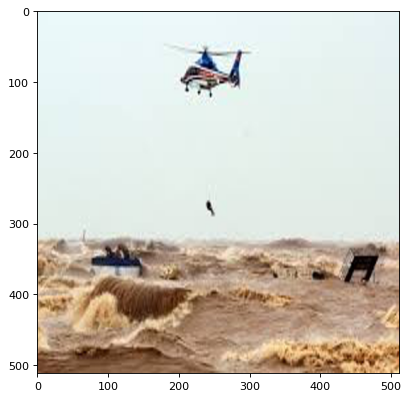

4
7988.jpg


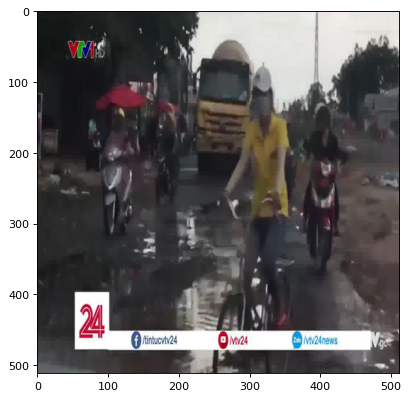

5
9056.jpg


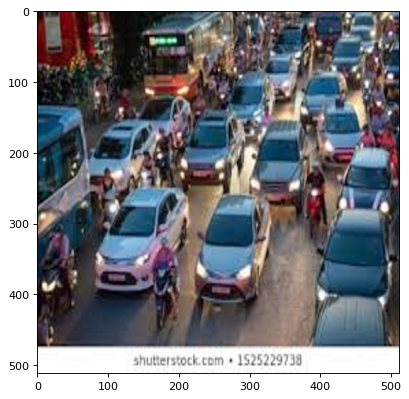

6
11241.jpg


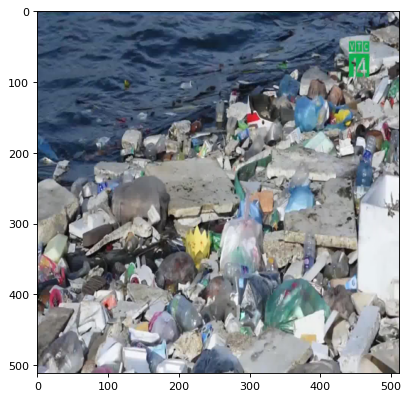

7
13060.jpg


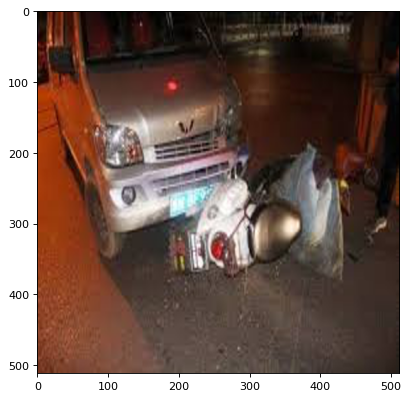

In [ ]:
fd = pd.read_csv("/content/train.csv")
dataset_folder = "/content/train/train/"

for i in range(8):
  print(i)
  image_name = str(fd[fd["label"]==i]["image_id"].iloc[0])
  print(image_name)
  figure(figsize=(8, 6), dpi=80)
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  plt.imshow(pil_image) 
  plt.show()  # display it

In [ ]:
df = pd.read_csv("/content/drive/My Drive/Thesis/model/vgg-twit_dataset-with-classes.csv")
df[df['class_binary']==0].head()

,Unnamed: 0,Unnamed: 0.1,prob_flood,prob_not_flood,image_id,class_binary
0,0,0,0.022672,0.977328,/content/drive/MyDrive/Thesis/model/twitter_da...,0
1,1,1,0.862047,0.137953,/content/drive/MyDrive/Thesis/model/twitter_da...,0
2,2,2,0.133806,0.866194,/content/drive/MyDrive/Thesis/model/twitter_da...,0
3,3,3,0.047203,0.952797,/content/drive/MyDrive/Thesis/model/twitter_da...,0
4,4,4,0.018091,0.981909,/content/drive/MyDrive/Thesis/model/twitter_da...,0


In [ ]:
data = None
data1 = None
twit_dataset = pd.DataFrame(columns = ['id','URL', 'Flooding', "Pollution", 'Depth'])
with open("/content/drive/My Drive/Thesis/model/harz17.json", "r") as read_file:
    data = json.load(read_file)
with open("/content/drive/My Drive/Thesis/model/rhine18.json", "r") as read_file:
    data1 = json.load(read_file)
json_string = json.dumps(data)
json_string1 = json.dumps(data1)
for i in data1:
  twit_dataset = twit_dataset.append({'id':i,'URL' : data1[i]['URL'], 'Flooding':data1[i]['RelFlooding'], "Pollution":data1[i]['RelPollution'], 'Depth':data1[i]['RelDepth']}, ignore_index=True )

for i in data:
  twit_dataset = twit_dataset.append({'id':i,'URL' : data[i]['URL'], 'Flooding':data[i]['RelFlooding'], "Pollution":data[i]['RelPollution'], 'Depth':data[i]['RelDepth']}, ignore_index=True )

twit_dataset.head(10)
twit_dataset.to_csv("/content/drive/My Drive/Thesis/model/twit_dataset_for_chart.csv")

In [ ]:
df = pd.read_csv("/content/drive/My Drive/Thesis/model/twit_dataset_for_chart.csv")
df.head()
print(df[df['Flooding']==False].size)
print(df[df['Flooding']].size)
print(df[df['Pollution']].size)
print(df[df['Depth']].size)

print(df[(df['Flooding'] & df['Pollution'])].size)
print(df[(df['Flooding'] & df['Depth'])].size)

print()

8928
6384
72
3564
66
3564



In [ ]:
df = pd.read_csv("/content/train-scene classification/train.csv")
df.head()

,image_name,label
0,0.jpg,0
1,1.jpg,4
2,2.jpg,5
3,4.jpg,0
4,7.jpg,4


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


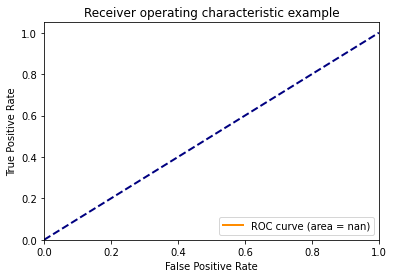

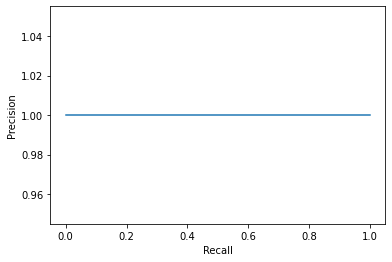

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.65      0.79       441

    accuracy                           0.65       441
   macro avg       0.50      0.33      0.39       441
weighted avg       1.00      0.65      0.79       441



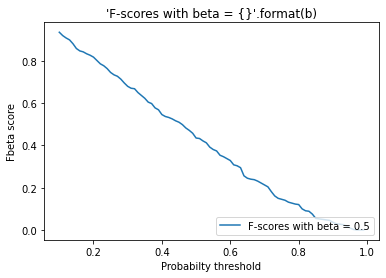

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/vgg-roadway-flooding-with-classes.csv",threshold=0.33)

Resnet roadway flooding evaluation

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:992: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  UndefinedMetricWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_ranking.py:1001: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  UndefinedMetricWarning,


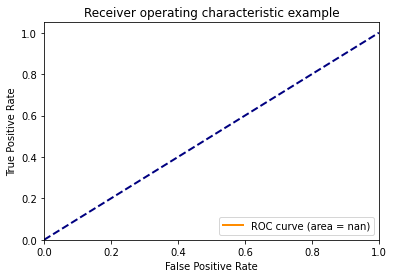

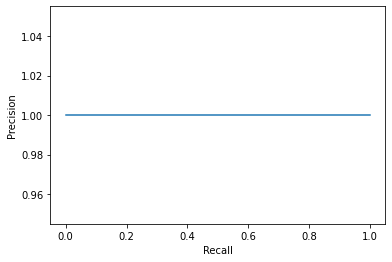

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.78      0.88       441

    accuracy                           0.78       441
   macro avg       0.50      0.39      0.44       441
weighted avg       1.00      0.78      0.88       441



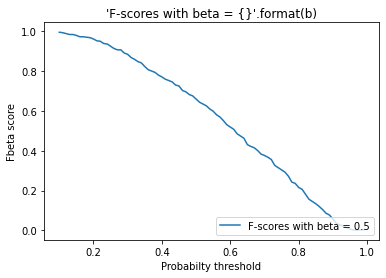

In [ ]:
evaluation("/content/drive/My Drive/Thesis/model/resnet-roadway-flooding-with-classes.csv",threshold=0.39)

In [ ]:
dataset_folder = "/content/train/train/"
for image_name in range(3900,4000,1):
  print(image_name)
  figure(figsize=(8, 6), dpi=80)
  pil_image = Image.open(dataset_folder + str(image_name)+".jpg").convert('RGB')
  pil_image = pil_image.resize((512, 512))
  plt.imshow(pil_image) 
  plt.show()  # display it

In [ ]:
dataset_folder = "/content/train-scene classification/train/"
for i in range(6):
  print(i)
  print(df[df['label']==i].size)
  image_name = str(df[df["label"]==i]["image_name"].iloc[2])
  print(image_name)
  figure(figsize=(8, 6), dpi=80)
  pil_image = Image.open(dataset_folder + image_name).convert('RGB')
  pil_image = pil_image.resize((512, 512))
  plt.imshow(pil_image) 
  plt.show()  # display it